In [1]:
import scanpy as sc
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['Arial']

In [2]:
adata=sc.read("adata_raw.h5ad")

In [3]:
adata.obs["plates"]=[n.split(":")[0] for n in adata.obs_names]

In [4]:
adata.obs["location"]="Adrenal"

In [5]:
adata.obs.loc[adata.obs_names.str.contains("SS2_19_358:([A-Q][0-1][3-9]|[A-Q]2[1-2])_R1"),
              "location"]="ZO"
adata.obs.loc[adata.obs_names.str.contains("SS2_19_358:([A-Q]23|[A-Q]24)_R1"),
              "location"]="SCG"

adata.obs.loc[adata.obs_names.str.contains("SS2_19_360:([A-Q][1-9]|[A-Q][0-1][0-2])_R1"),
              "location"]="Mesenteric"
adata.obs.loc[adata.obs_names.str.contains("SS2_19_360:([A-Q]1[5-9]|[A-Q]2[1-4])_R1"),
              "location"]="ZO"

adata.obs.loc[adata.obs_names.str.contains("SS2_19_362:([A-Q]1[5-9]|[A-Q]2[1-4])_R1"),
              "location"]="ZO"

adata.obs.loc[adata.obs.plates.isin(["SS2_19_346","SS2_19_348"]),"location"]="ZO"

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/strings/accessor.py:101: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [6]:
adata.obs["devtime"]="P2"

In [7]:
adata.obs.loc[adata.obs.plates.isin(["SS2_19_344","SS2_19_348"]),"devtime"]="E16.5"
adata.obs.loc[adata.obs.plates.isin(["SS2_19_342","SS2_19_346"]),"devtime"]="E14.5"

adata.obs.loc[adata.obs.plates.isin(["SS2_19_358"]),"devtime"]="E18.5"

adata.obs.loc[adata.obs.plates.isin(["SS2_16_249-2"]),"devtime"]="E12.5"
adata.obs.loc[adata.obs.plates.isin(["SS2_16_250-2"]),"devtime"]="E13.5"


In [8]:
adata.obs.devtime.value_counts()

P2       768
E14.5    768
E16.5    768
E18.5    384
E12.5    384
E13.5    383
Name: devtime, dtype: int64

In [9]:
adata.var["mito"]=adata.var_names.str.startswith("mt-")

In [10]:
sc.pp.calculate_qc_metrics(adata,qc_vars=["mito"],log1p=None,percent_top=None,inplace=True)

In [11]:
sc.set_figure_params()

In [12]:
adata.obs

,plates,location,devtime,n_genes_by_counts,total_counts,total_counts_mito,pct_counts_mito
SS2_19_362:F14,SS2_19_362,Adrenal,P2,2221,512841.0,23121.0,4.508415
SS2_19_360:D23,SS2_19_360,Adrenal,P2,837,216756.0,41702.0,19.239143
SS2_19_346:H18,SS2_19_346,ZO,E14.5,6973,395262.0,12769.0,3.230515
SS2_19_360:O17,SS2_19_360,Adrenal,P2,4470,299210.0,7667.0,2.562414
SS2_19_348:N17,SS2_19_348,ZO,E16.5,5166,446392.0,12148.0,2.721375
...,...,...,...,...,...,...,...
SS2_19_342:G5,SS2_19_342,Adrenal,E14.5,6697,474070.0,13731.0,2.896408
SS2_19_362:H8,SS2_19_362,Adrenal,P2,1490,166276.0,117656.0,70.759460
SS2_19_358:F5,SS2_19_358,Adrenal,E18.5,3690,27313.0,373.0,1.365650
SS2_16_249-2:O20,SS2_16_249-2,Adrenal,E12.5,7301,318847.0,12641.0,3.964597


... storing 'plates' as categorical
... storing 'location' as categorical
... storing 'devtime' as categorical


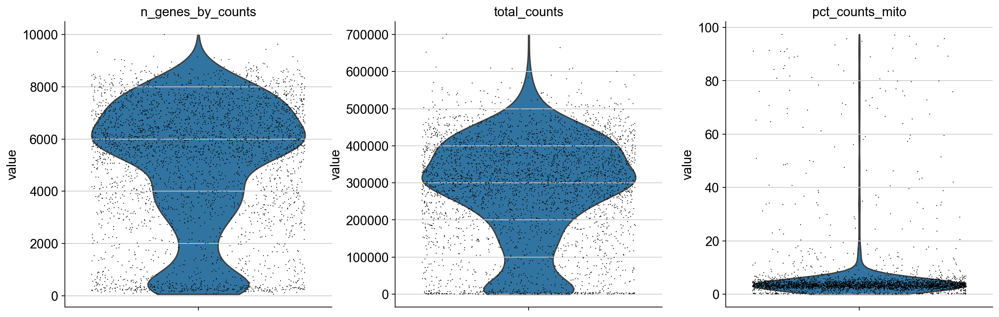

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mito'],
             jitter=0.4, multi_panel=True)

In [14]:
adata=adata[(adata.obs.n_genes_by_counts>1000) & (adata.obs.total_counts>5e4) & (adata.obs.pct_counts_mito<10)]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [15]:
adata

View of AnnData object with n_obs × n_vars = 2900 × 53762
    obs: 'plates', 'location', 'devtime', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [16]:
sc.pp.filter_genes(adata,min_cells=3)

Trying to set attribute `.var` of view, copying.


In [17]:
adata.raw=adata

In [18]:
sc.pp.normalize_total(adata,target_sum=1e3)
sc.pp.log1p(adata)

In [19]:
import scFates as scf

Finding overdispersed features
    computing mean and variances
    gam fitting
    found 5346 over-dispersed features (0:00:02) --> added 
    .var['res'], residuals of GAM fit.
    .var['lp'], p-value.
    .var['lpa'], BH adjusted p-value.
    .var['qv'], percentile of qui-squared distribution.
    .var['highly_variable'], feature is over-dispersed.



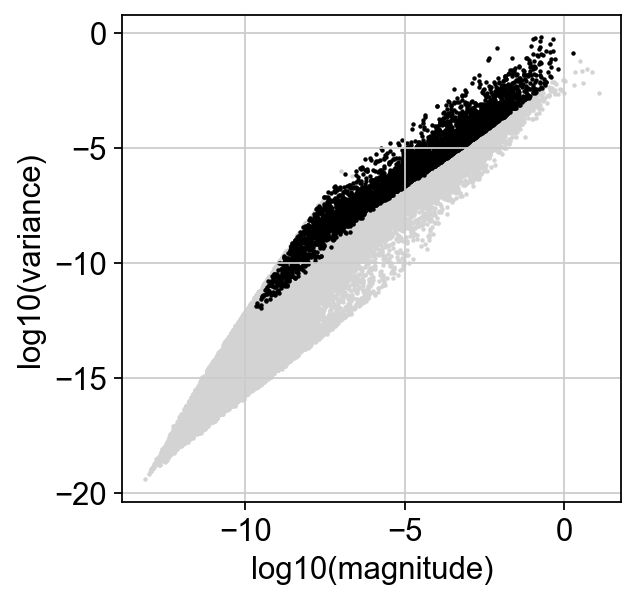

In [20]:
scf.pp.find_overdispersed(adata,plot=True)

In [21]:
adata.obsm["X_pca"]=sc.pp.pca(sc.pp.scale(adata[:,adata.var.highly_variable].X,copy=True,max_value=10))

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [22]:
sc.pp.neighbors(adata)

In [23]:
sc.tl.umap(adata)

In [24]:
from matplotlib.colors import LinearSegmentedColormap
cmap_dev=LinearSegmentedColormap.from_list("aspect",["#3A1C71","#CB6776","#FEAE7B"])

In [25]:
import numpy as np

In [27]:
from matplotlib.colors import rgb2hex

sc.pl.umap(adata,color="devtime",palette=[rgb2hex(c) for c in cmap_dev(np.linspace(1,0,6))])

saving figure to file ./figures/scvelo_QC.svg


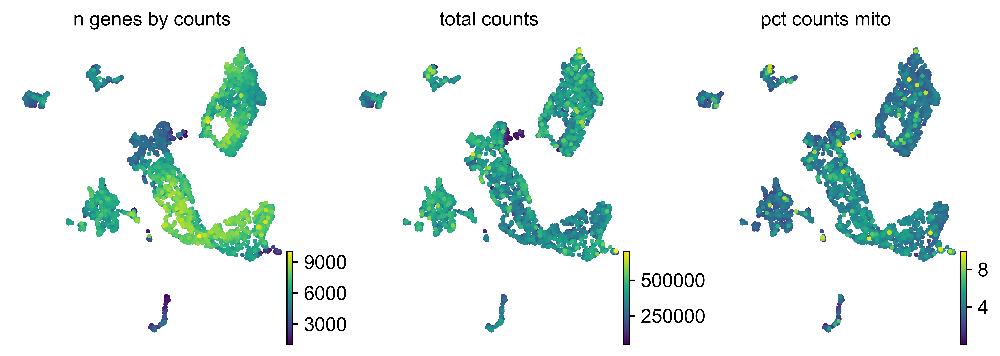

In [28]:
import scvelo as scv
scv.set_figure_params(figsize=(3.5,3.5),dpi_save=600)
scv.pl.umap(adata,color=['n_genes_by_counts', 'total_counts', 'pct_counts_mito'],cmap="viridis",save="QC.svg",dpi=600)

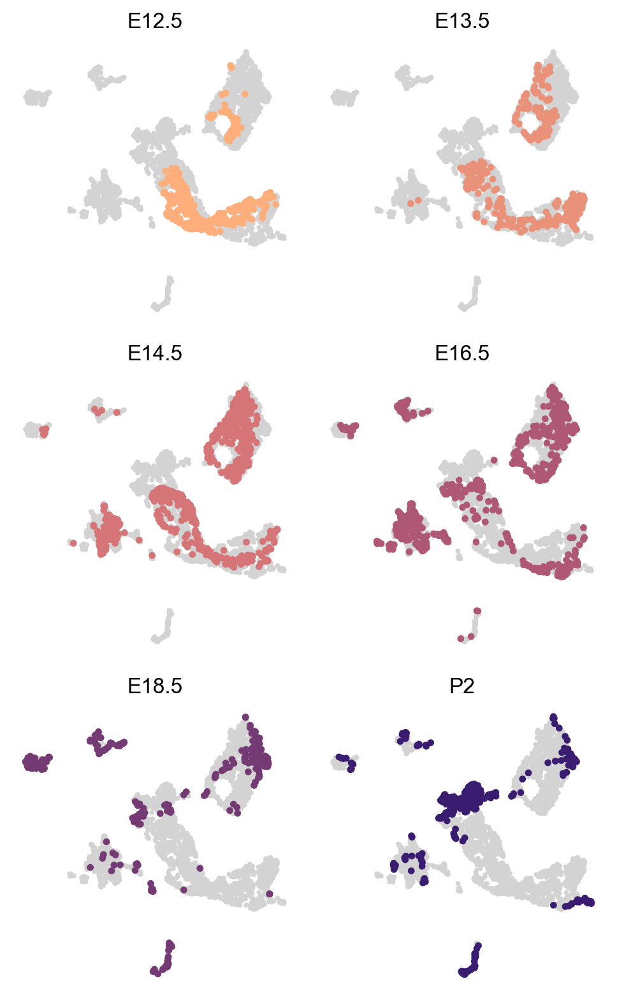

In [74]:
fig, axs = plt.subplots(nrows=3,ncols=2,figsize=(5,8))
axs=np.ravel(axs)
for i,d in enumerate(adata.obs.devtime.cat.categories):
    scv.pl.umap(adata,color="devtime",legend_loc="none",s=60,title=d,groups=[d],ax=axs[i],show=False,dpi=600)
plt.tight_layout()
plt.savefig("figures/All_devtime.svg",dpi=600)

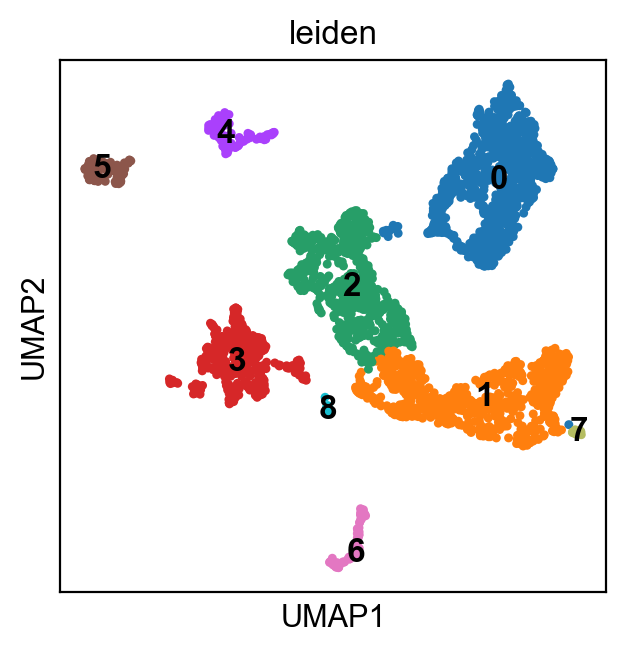

In [47]:
sc.tl.leiden(adata,resolution=.1)
sc.pl.umap(adata,color="leiden",legend_loc="on data")

In [48]:
sc.tl.rank_genes_groups(adata,"leiden",use_raw=False)

In [64]:
adata.obs["cell-type"]=adata.obs.leiden.cat.rename_categories(["Symp.","ChC prog.","Glia","Medullary","Immune","Endothelial","Erythroid","ChC","Endocrine"])

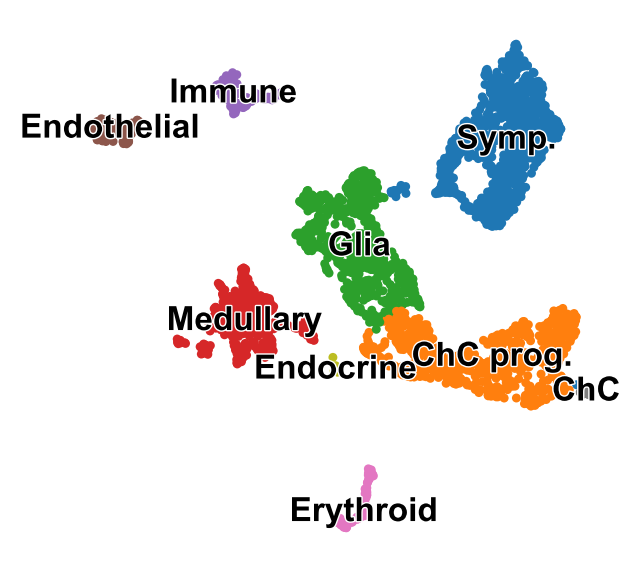

In [78]:
sc.pl.umap(adata,color="cell-type",legend_loc="on data",frameon=False,title="",legend_fontoutline=True,save="celltype.svg")

In [65]:
sc.tl.rank_genes_groups(adata,"cell-type",use_raw=False)

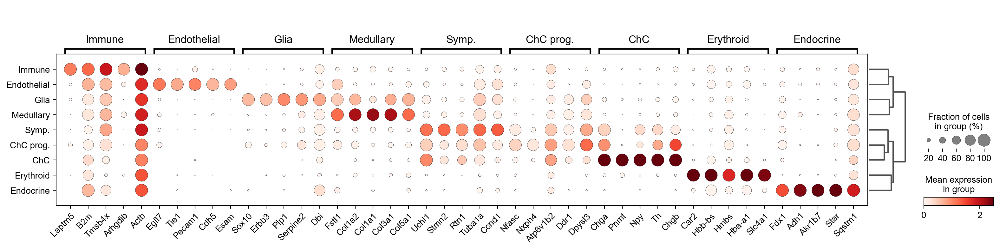

In [68]:
ax=sc.pl.rank_genes_groups_dotplot(adata,use_raw=False,vmax=2.5,n_genes=5,var_group_rotation=0,show=False)
plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
plt.savefig("figures/T92_dotplot.svg",bbox_inches='tight')

In [54]:
adata.obs.leiden.isin(["2","1","7"]).sum()

1361

In [36]:
adata.write_h5ad("adata_QC.h5ad")

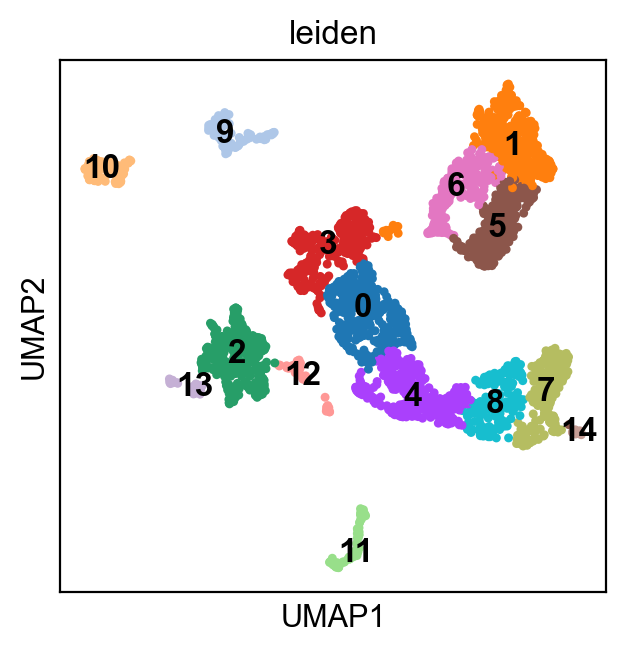

In [45]:
adata=sc.read("adata_QC.h5ad")
sc.pl.umap(adata,color="leiden",legend_loc="on data")
adata.obs["sel"]=adata.obs.leiden.isin(["2","1","7"]).astype("str")
adata.obs.loc[adata.obs.sel=="False","sel"]=np.nan
adata.obs.loc[adata.obs.sel=="True","sel"]="Glia & Chromaffin"

In [50]:
adata.obs.sel=adata.obs.sel.astype("category")

saving figure to file ./figures/scvelo_All_sel.svg


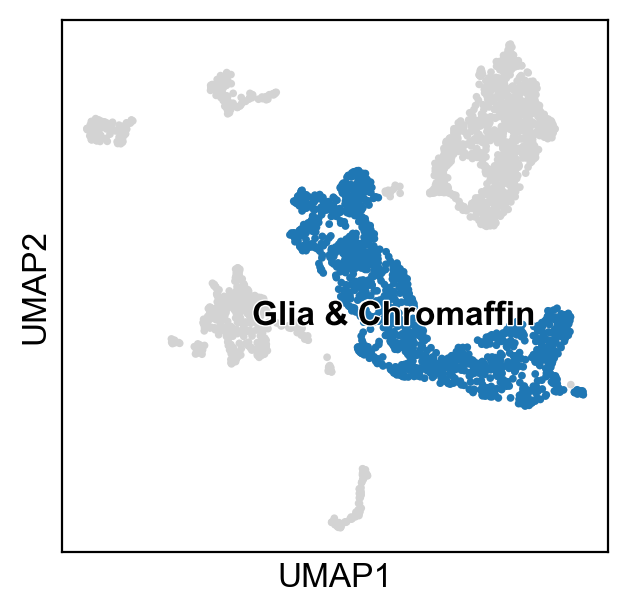

In [54]:
scv.pl.umap(adata,color="sel",legend_loc="on data",title="",frameon=True,save="All_sel.svg")

In [55]:
adata=adata[adata.obs.sel=="Glia & Chromaffin"]
del adata.obs["sel"]

In [56]:
adata

View of AnnData object with n_obs × n_vars = 1361 × 35535
    obs: 'plates', 'location', 'devtime', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'leiden'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'm', 'v', 'n_obs', 'res', 'lp', 'lpa', 'qv', 'highly_variable'
    uns: 'devtime_colors', 'leiden', 'leiden_colors', 'neighbors', 'umap', 'sel_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

Trying to set attribute `.var` of view, copying.


Finding overdispersed features
    computing mean and variances
    gam fitting
    found 3865 over-dispersed features (0:00:01) --> added 
    .var['res'], residuals of GAM fit.
    .var['lp'], p-value.
    .var['lpa'], BH adjusted p-value.
    .var['qv'], percentile of qui-squared distribution.
    .var['highly_variable'], feature is over-dispersed.



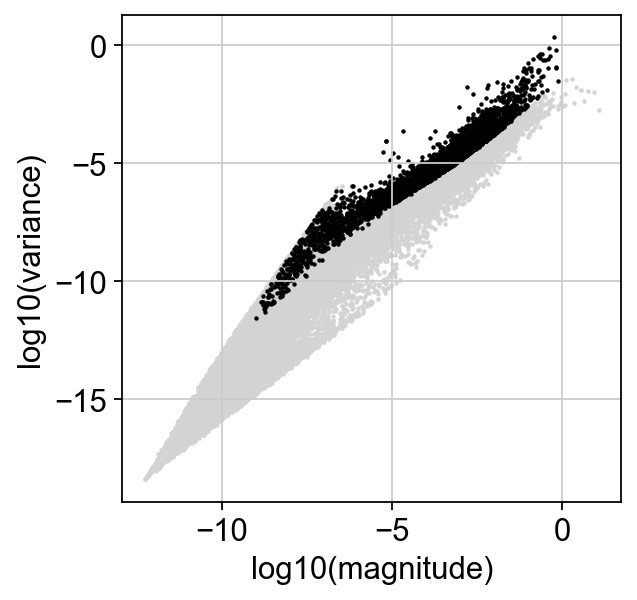

In [34]:
sc.pp.filter_genes(adata,min_cells=3)
scf.pp.find_overdispersed(adata,plot=True)

In [35]:
s_genes_list = \
    ['Mcm5', 'Pcna', 'Tyms', 'Fen1', 'Mcm2', 'Mcm4', 'Rrm1', 'Ung', 'Gins2',
     'Mcm6', 'Cdca7', 'Dtl', 'Prim1', 'Uhrf1', 'Mlf1ip', 'Hells', 'Rfc2',
     'Rpa2', 'Nasp', 'Rad51ap1', 'Gmnn', 'Wdr76', 'Slbp', 'Ccne2', 'Ubr7',
     'Pold3', 'Msh2', 'Atad2', 'Rad51', 'Rrm2', 'Cdc45', 'Cdc6', 'Exo1', 'Tipin',
     'Dscc1', 'Blm', 'Casp8ap2', 'Usp1', 'Clspn', 'Pola1', 'Chaf1b', 'Brip1', 'E2f8']

g2m_genes_list = \
    ['Hmgb2', 'Cdk1', 'Nusap1', 'Ube2c', 'Birc5', 'Tpx2', 'Top2a', 'Ndc80',
     'Cks2', 'Nuf2', 'Cks1b', 'Mki67', 'Tmpo', 'Cenpf', 'Tacc3', 'Fam64a',
     'Smc4', 'Ccnb2', 'Ckap2l', 'Ckap2', 'Aurkb', 'Bub1', 'Kif11', 'Anp32e',
     'Tubb4b', 'Gtse1', 'Kif20b', 'Hjurp', 'Cdca3', 'Hn1', 'Cdc20', 'Ttk',
     'Cdc25c', 'Kif2c', 'Rangap1', 'Ncapd2', 'Dlgap5', 'Cdca2', 'Cdca8',
     'Ect2', 'Kif23', 'Hmmr', 'Aurka', 'Psrc1', 'Anln', 'Lbr', 'Ckap5',
     'Cenpe', 'Ctcf', 'Nek2', 'G2e3', 'Gas2l3', 'Cbx5', 'Cenpa']
s_genes_list=adata.var_names[adata.var_names.isin(s_genes_list)]
g2m_genes_list=adata.var_names[adata.var_names.isin(g2m_genes_list)]

In [36]:
adata.var.loc[s_genes_list,"highly_variable"]=False
adata.var.loc[g2m_genes_list,"highly_variable"]=False

In [37]:
adata.obsm["X_pca"]=sc.pp.pca(sc.pp.scale(adata[:,adata.var.highly_variable].X,copy=True,max_value=10))

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [38]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=.3)

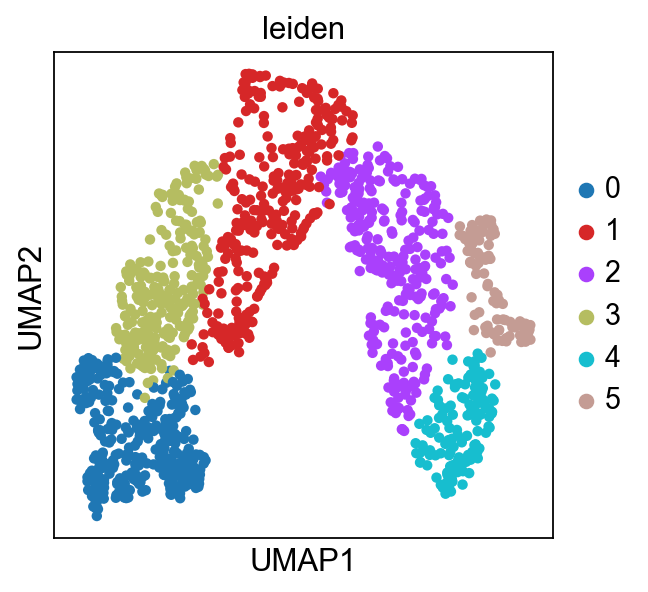

In [39]:
sc.pl.umap(adata,color="leiden")

In [41]:
adata.layers["scaled"]=sc.pp.scale(adata.X,copy=True)

In [96]:
adata.obs["annot"]=adata.obs.leiden.cat.rename_categories(["SC","SCP-ChC prog.","ChC 1","SCP","ChC 2","ChC 3"])

In [99]:
sc.tl.rank_genes_groups(adata,"annot",use_raw=False)

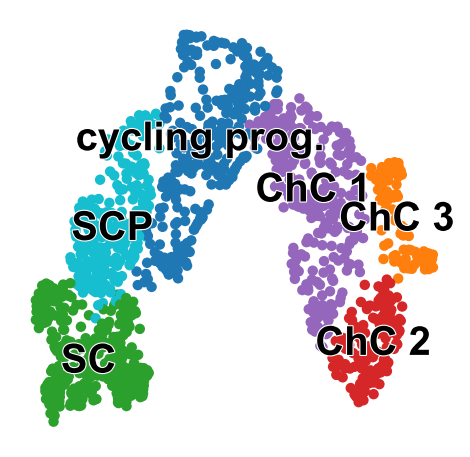

In [76]:
sc.set_figure_params(dpi_save=600,figsize=(3.5,3.5),frameon=False)
sc.pl.umap(adata,color="annot",title="",palette=["tab:green","tab:blue","tab:purple","tab:cyan","tab:red","tab:orange"],
           frameon=False,legend_fontsize=18,legend_loc="on data",save="Leiden.svg",legend_fontoutline=True)

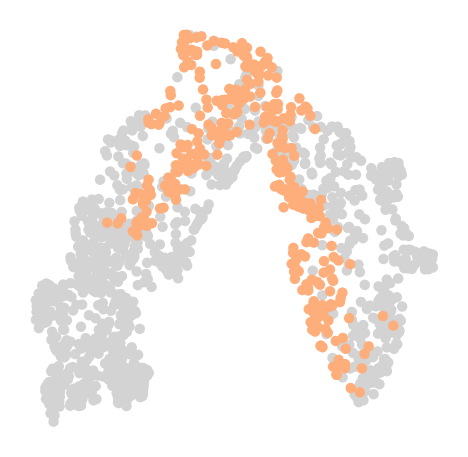

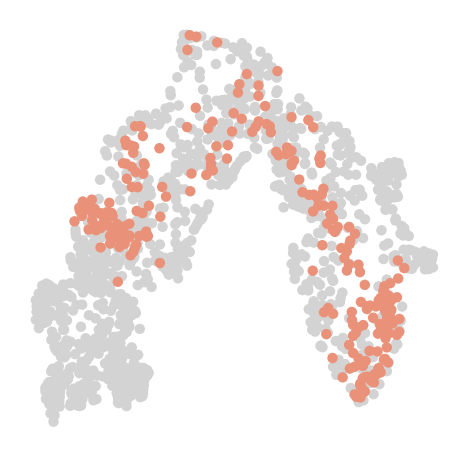

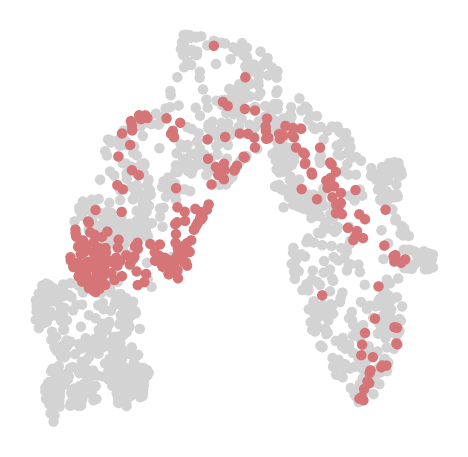

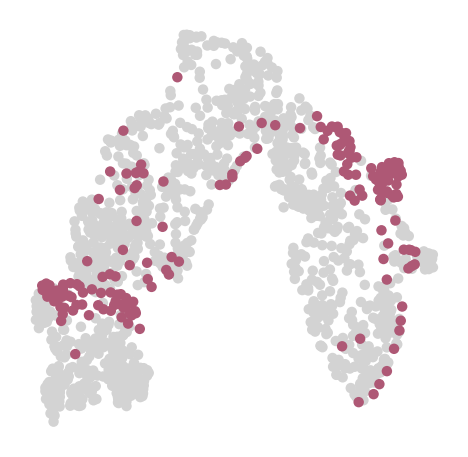

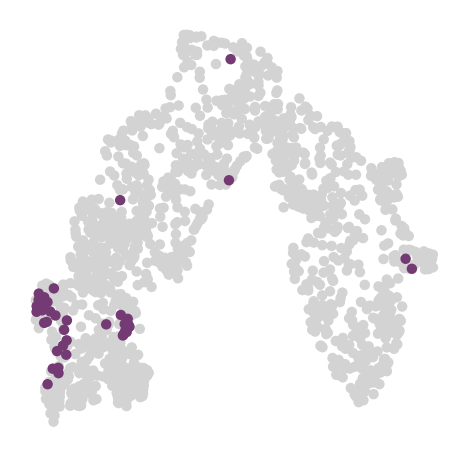

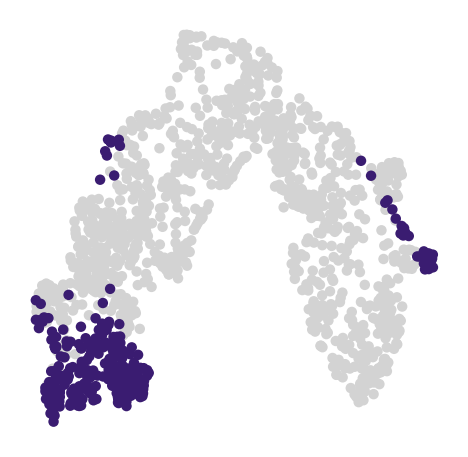

In [50]:
for dev in adata.obs.devtime.cat.categories:
    sc.pl.umap(adata,color="devtime",title="",groups=dev,legend_loc="none",frameon=False,save=dev+".png")

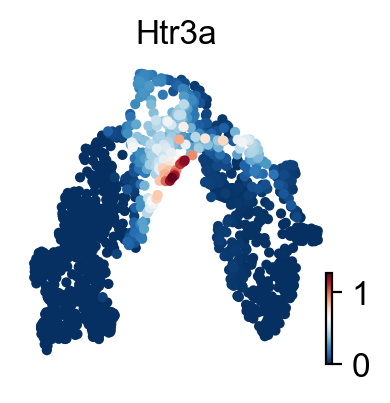

In [66]:
scv.pl.umap(adata,color="Htr3a",use_raw=False,smooth=True)

In [64]:
sc.get.rank_genes_groups_df(adata,"ChC 1",log2fc_min=2).names[:50]

0      Hand2os1
1         Nfasc
2         Tubb3
3        Phox2a
4         Pcbp3
5         Celf3
6         Stmn3
7         Agtr2
8          Eml5
9         Gata3
10        Zdbf2
11          Tub
12         Miat
13         St18
14        Unc5c
15       Elavl3
16        Srrm3
17        Rims2
18         Nefm
19     Arhgef28
20        Tbx20
21        Syt17
22        Kif5a
23     Fam160a1
24        Insm2
25      Slc10a4
26         Nefl
27        Sytl4
28          Nrk
29         Pclo
30        Mfap4
31       Chrna3
32       Rnf112
33      Gm37899
34        Smpd3
35         Eya1
36        Nova2
37    Adcyap1r1
38       Mapk11
39        Abcg1
40          Ace
41       Chrnb2
42         Isl1
43      Jakmip2
44       Chrnb4
45        Reep2
46       Trim46
47        Tiam2
48        Dach1
49       Usp27x
Name: names, dtype: object

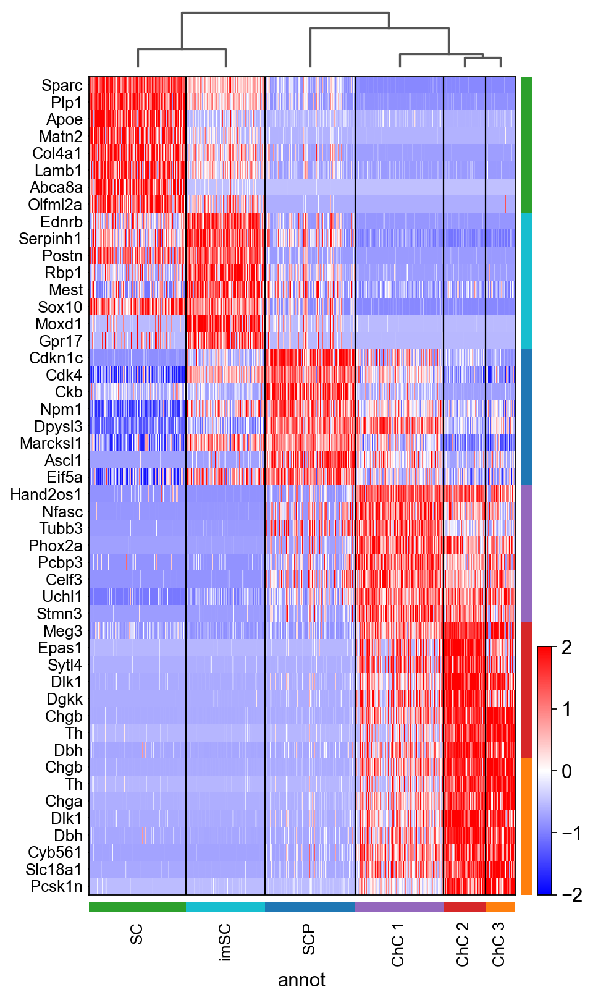

In [74]:
sc.set_figure_params(dpi_save=600)
sc.tl.dendrogram(adata,"leiden",n_pcs=10,optimal_ordering=True)
sc.pl.rank_genes_groups_heatmap(adata,layer="scaled",swap_axes=True,figsize=(6,12),var_group_rotation=45,min_logfoldchange=0,
                                cmap="bwr",vmin=-2,vmax=2,n_genes=8,show_gene_labels=True,save="heatmap.svg")

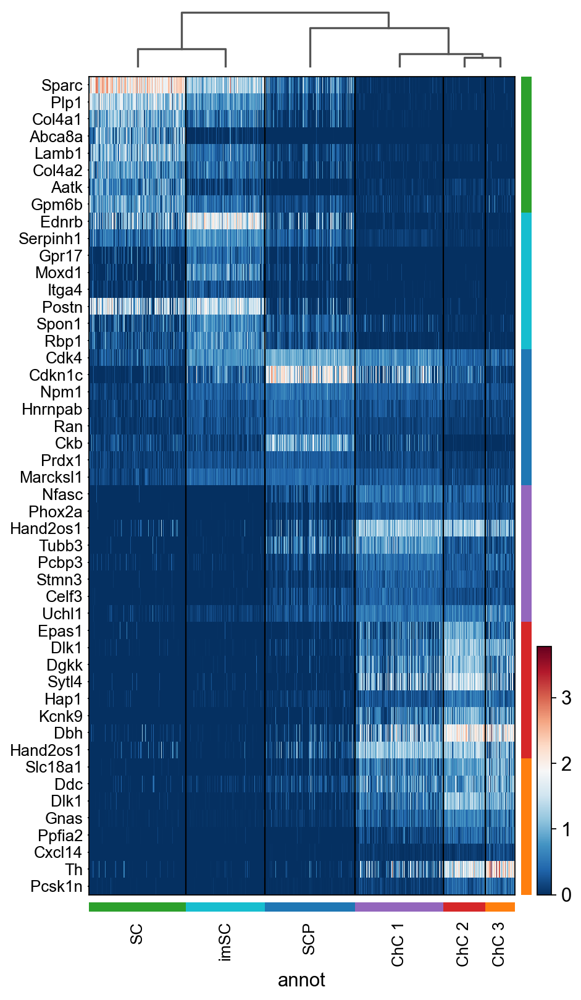

In [44]:
sc.pl.rank_genes_groups_heatmap(adata,use_raw=False,swap_axes=True,figsize=(6,12),var_group_rotation=45,min_logfoldchange=2,
                                n_genes=8,show_gene_labels=True,save="heatmap.svg")

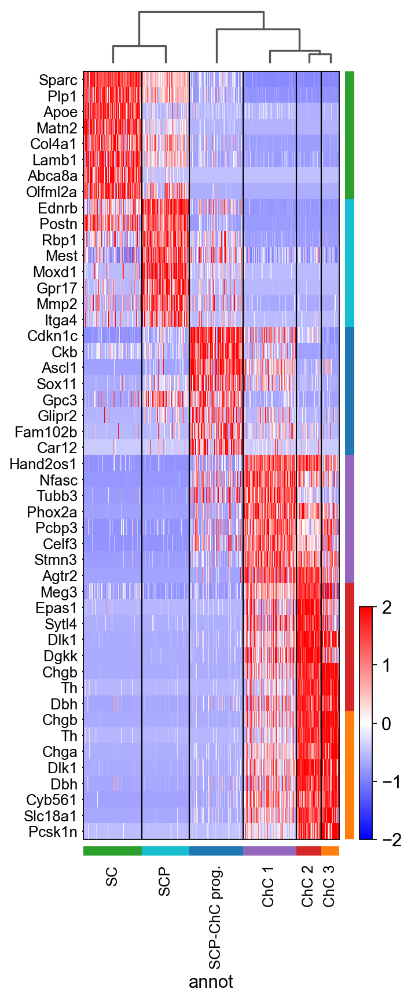

In [105]:
sc.set_figure_params(dpi_save=600)
sc.tl.dendrogram(adata,"annot",n_pcs=10,optimal_ordering=True)
sc.pl.rank_genes_groups_heatmap(adata,layer="scaled",swap_axes=True,figsize=(4,12),var_group_rotation=45,min_logfoldchange=2,
                                cmap="bwr",vmin=-2,vmax=2,n_genes=8,show_gene_labels=True,save="heatmap.svg")

In [52]:
genes=["Sox10","Plp1","Htr3a","Chgb","Th","Dbh"]

saving figure to file ./figures/scvelo_known_markers.svg


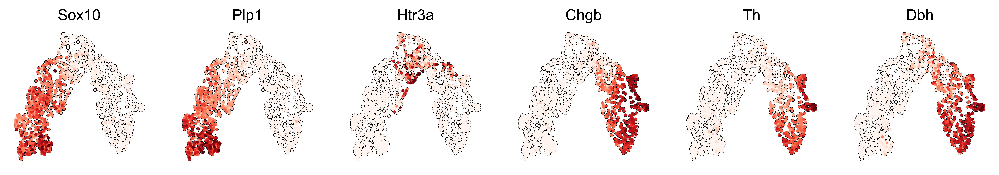

In [56]:
scv.set_figure_params(figsize=(2.3,2),dpi_save=600)
scv.pl.umap(adata,color=genes,cmap="Reds",use_raw=False,
            colorbar=False,add_outline=True,outline_width=(0.1,0.01),dpi=600,s=20,perc=[1,99.5],ncols=6,save="known_markers.svg")

In [49]:
import scvelo as scv

In [50]:
scv.tl.score_genes_cell_cycle(adata)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


In [51]:
scv.set_figure_params(figsize=(3.5,3.5))

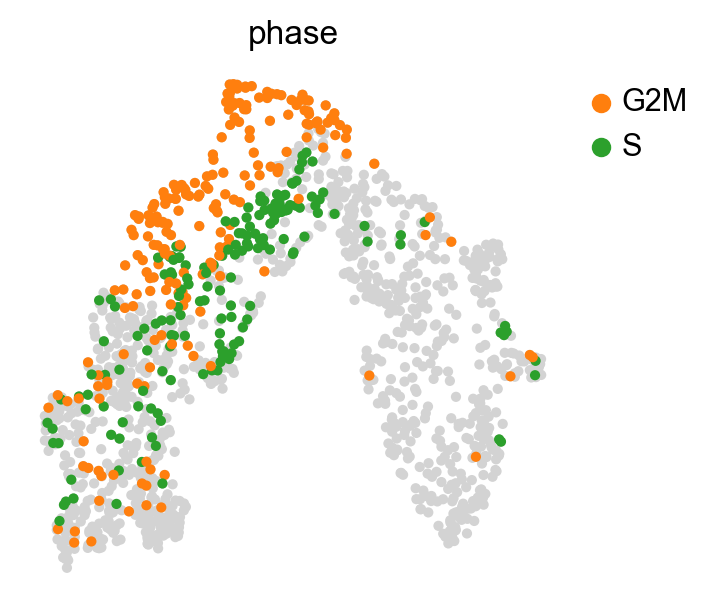

In [52]:
scv.pl.umap(adata,color="phase",groups=["G2M","S"])

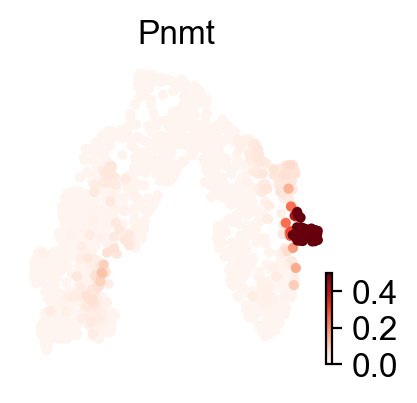

In [82]:
scv.pl.umap(adata,color="Pnmt",use_raw=False,vmax=.5,cmap="Reds",smooth=True)

saving figure to file ./figures/scvelo_markers.svg


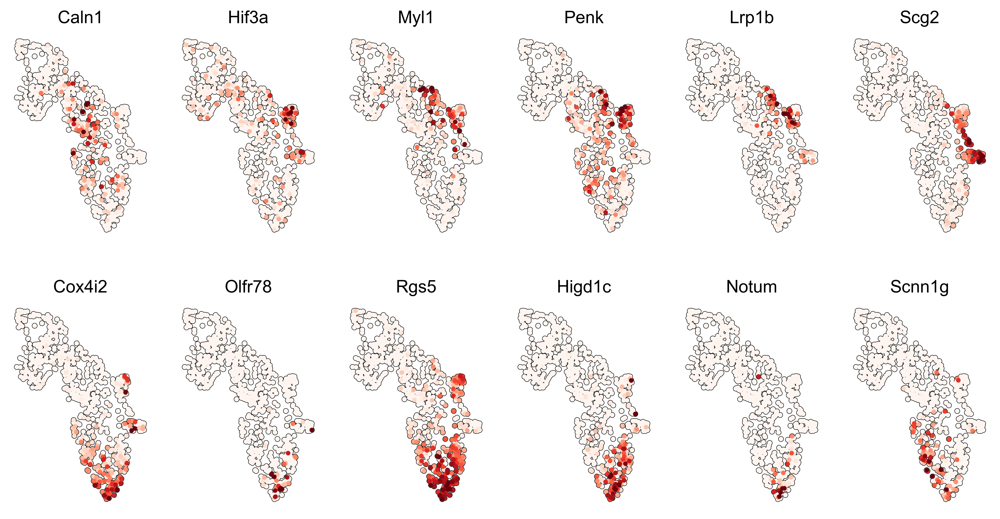

In [93]:
genes=["Caln1","Hif3a","Myl1","Penk","Lrp1b","Scg2","Cox4i2","Olfr78","Rgs5","Higd1c","Notum","Scnn1g"]
import scvelo as scv
scv.set_figure_params(figsize=(2,3),dpi_save=600)
scv.pl.umap(adata_focus,color=genes,cmap="Reds",use_raw=False,dpi=300,
            colorbar=False,add_outline=True,outline_width=(0.1,0.01),s=40,perc=[0,99.5],ncols=6,save="markers.svg")

In [ ]:
scv.pl.umap(adata,color=genes,cmap="Reds",use_raw=False,
            colorbar=False,add_outline=True,outline_width=(0.1,0.01),dpi=600,s=20,perc=[1,99.5],ncols=2,save="markers.svg")

In [63]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython
adata_raw=adata.raw.to_adata()

In [64]:
adata_raw

AnnData object with n_obs × n_vars = 1361 × 35535
    obs: 'plates', 'location', 'devtime', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'leiden', 'S_score', 'G2M_score', 'phase'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'devtime_colors', 'leiden', 'neighbors', 'umap', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden', 'phase_colors'
    obsm: 'X_pca', 'X_umap'

In [65]:
%%R -i adata_raw -o ct
source("CytoTRACE.R")
rownames(adata_raw@assays@data$X)=rownames(adata_raw)
colnames(adata_raw@assays@data$X)=colnames(adata_raw)
results=CytoTRACE(adata_raw@assays@data$X,ncores=1)
ct=results$CytoTRACE

In [66]:
adata.obs["CytoTRACE"]=ct

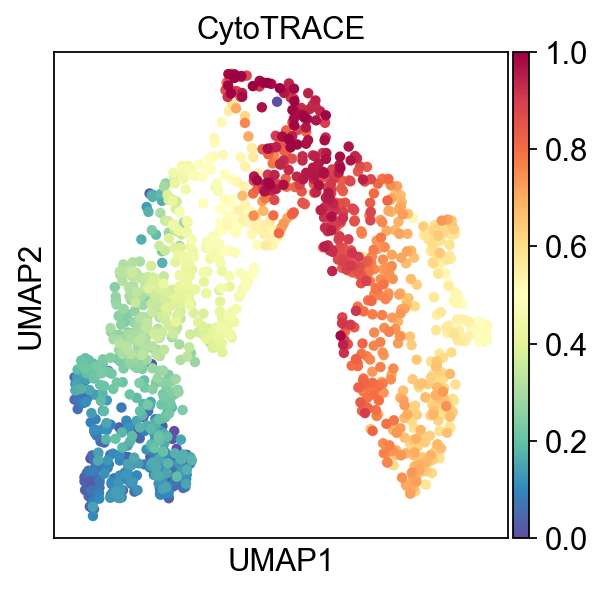

In [67]:
sc.set_figure_params()
sc.pl.umap(adata,color="CytoTRACE",cmap="Spectral_r")

In [94]:
sc.tl.leiden(adata,resolution=1.5)

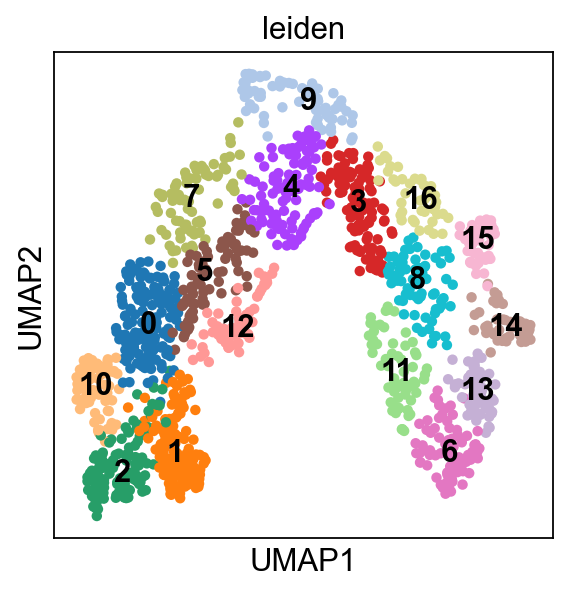

In [100]:
sc.set_figure_params()
sc.pl.umap(adata,color="leiden",legend_loc="on data")

In [97]:
adata.write("adata_ChC.h5ad")

In [105]:
adata.X.data

array([0.01257069, 0.0660781 , 0.01006916, ..., 0.44679415, 2.729708  ,
       0.03493035], dtype=float32)